In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, accuracy_score, f1_score, roc_curve, auc, confusion_matrix
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import copy

In [3]:
class FaceAttributeDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.attributes = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.attributes)

    def __getitem__(self, idx):
        img_name = self.attributes.iloc[idx, 0]
        img_path = f"{self.img_dir}/{img_name}"
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        label = self.attributes.iloc[idx, 2]  # Arched_Eyebrows is the 3rd column (index 2)
        label = torch.tensor(1 if label == 1 else 0, dtype=torch.float32)

        return image, label


In [4]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load and Split Data
dataset = FaceAttributeDataset('/home/aayushjeevan/Desktop/YOLOv3/face_images/face_image_attr.csv', '/home/aayushjeevan/Desktop/YOLOv3/img_align_celeba', transform=transform)

train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_data, val_data, test_data = torch.utils.data.random_split(dataset, [train_size, val_size, test_size], generator=torch.Generator().manual_seed(42))

train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader = DataLoader(val_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)


In [5]:
# Load the ResNet18 model
model = models.resnet18(pretrained=True)

# Freeze all layers except the fully connected layer
for param in model.parameters():
    param.requires_grad = False

# Replace the final fully connected layer
model.fc = nn.Linear(model.fc.in_features, 1)

# Unfreeze the parameters of the fully connected layer to fine-tune
for param in model.fc.parameters():
    param.requires_grad = True

# Move model to the device (GPU or CPU)
model = model.to('cuda' if torch.cuda.is_available() else 'cpu')

# Loss and optimizer
criterion = nn.BCEWithLogitsLoss()

# Use a lower learning rate for fine-tuning
optimizer = optim.Adam(model.fc.parameters(), lr=0.0001)

# Learning rate scheduler
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)


/home/aayushjeevan/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aayushjeevan/anaconda3/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /home/aayushjeevan/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 58.6MB/s]


In [7]:
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=10, patience=5):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    # Initialize variables inside the function
    best_val_loss = float('inf')
    early_stop_counter = 0
    best_model = copy.deepcopy(model.state_dict())

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0.0
        for images, labels in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * images.size(0)

        train_loss = train_loss / len(train_loader.dataset)

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds = []
        val_labels = []
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images).squeeze()
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)
                val_preds.extend(torch.sigmoid(outputs).cpu().numpy())
                val_labels.extend(labels.cpu().numpy())

        val_loss = val_loss / len(val_loader.dataset)
        val_accuracy = accuracy_score(val_labels, np.round(val_preds))

        print(f'Epoch {epoch+1}/{num_epochs}')
        print(f'Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.4f}')

        # Early Stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model = copy.deepcopy(model.state_dict())
            early_stop_counter = 0
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                print("Early stopping!")
                model.load_state_dict(best_model)
                break

        # Update learning rate scheduler
        scheduler.step(val_loss)

    # Load the best model before returning
    model.load_state_dict(best_model)
    return model, val_preds, val_labels


# Evaluation Function
def evaluate_model(model, test_loader):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).squeeze()
            preds = torch.sigmoid(outputs).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)


    return precision, accuracy, f1, fpr, tpr, roc_auc, cm

# %%
model, val_preds, val_labels =train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=10, patience=5)

# Save model weights
torch.save(model.state_dict(), 'resnet18_arch_eyebrows.pth')
print("Model weights saved to resnet18_arch_eyebrows.pth")

KeyboardInterrupt: 

In [11]:
precision, accuracy, f1, fpr, tpr, roc_auc, cm = evaluate_model(model, test_loader)

# Print evaluation metrics
print(f"Precision: {precision:.4f}")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

Precision: 0.6226
Accuracy: 0.7854
F1 Score: 0.5498
ROC AUC: 0.8362


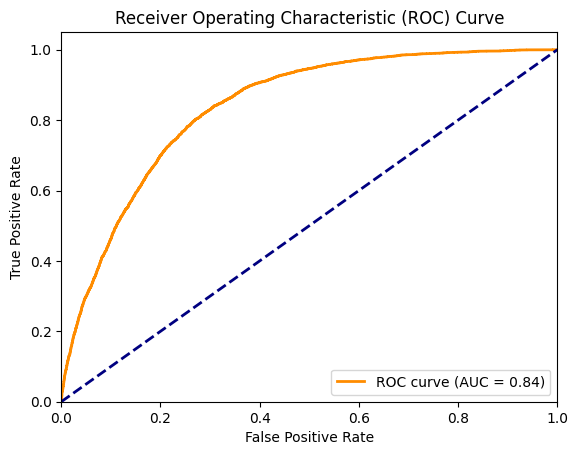

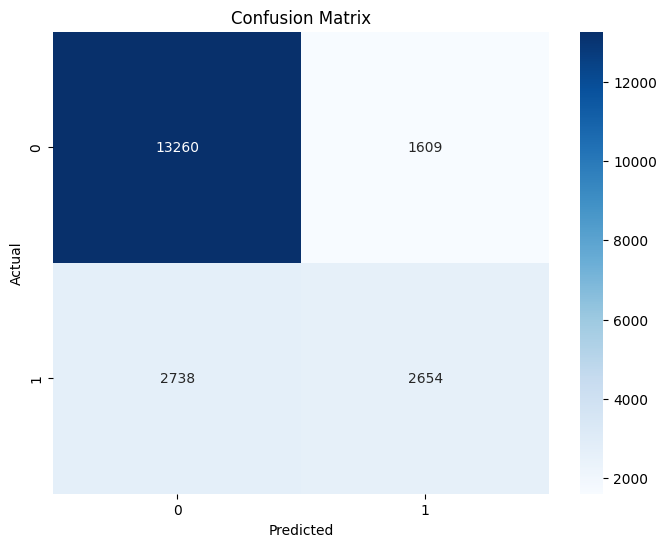

In [12]:
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [ ]:
import torch.optim as optim

# Function for running experiments with different hyperparameters
def run_experiment(lr, batch_size, num_epochs):
    print(f"\nStarting experiment with learning rate={lr}, batch size={batch_size}, epochs={num_epochs}...")
    
    # Load the ResNet18 model
    model = models.resnet18(pretrained=True)

    # Freeze all layers except the final fully connected layer
    for param in model.parameters():
        param.requires_grad = False

    # Replace the final fully connected layer
    model.fc = nn.Linear(model.fc.in_features, 1)

    # Fine-tune the fully connected layer
    for param in model.fc.parameters():
        param.requires_grad = True

    # Move model to device (GPU or CPU)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    # Define the loss function
    criterion = nn.BCEWithLogitsLoss()

    # Use Adam optimizer
    optimizer = optim.Adam(model.fc.parameters(), lr=lr)

    # Learning rate scheduler
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.5)

    # Adjust batch size for DataLoader
    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

    # Print information about the model and training process
    print(f"Model and data loaded. Training for {num_epochs} epochs with batch size {batch_size} and learning rate {lr}.")

    # Train the model with the specified hyperparameters
    model, val_preds, val_labels = train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs=num_epochs)

    # Evaluate the model
    print(f"Training complete. Evaluating the model on the test set...")
    precision, accuracy, f1, fpr, tpr, roc_auc, cm = evaluate_model(model, test_loader)

    # Print results for the current experiment
    print(f"Experiment Results for lr={lr}, batch_size={batch_size}, epochs={num_epochs}:")
    print(f"Precision: {precision:.4f}, Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}, ROC AUC: {roc_auc:.4f}")
    print("Confusion Matrix:")
    print(cm)

    return accuracy, f1, roc_auc

# List of hyperparameters to experiment with
learning_rates = [0.001, 0.0001]
batch_sizes = [16, 32]
epochs_list = [5, 10]

# Run experiments and collect results
experiment_results = []

# Tracking total number of experiments
total_experiments = len(learning_rates) * len(batch_sizes) * len(epochs_list)
current_experiment = 1

for lr in learning_rates:
    for batch_size in batch_sizes:
        for num_epochs in epochs_list:
            # Print progress
            print(f"\nRunning experiment {current_experiment}/{total_experiments}...")
            accuracy, f1, roc_auc = run_experiment(lr, batch_size, num_epochs)
            experiment_results.append({
                'learning_rate': lr,
                'batch_size': batch_size,
                'epochs': num_epochs,
                'accuracy': accuracy,
                'f1_score': f1,
                'roc_auc': roc_auc
            })
            current_experiment += 1

# Print all results in a summarized form
print("\nAll Experiment Results:")
for result in experiment_results:
    print(f"LR: {result['learning_rate']}, Batch Size: {result['batch_size']}, Epochs: {result['epochs']}")
    print(f"Accuracy: {result['accuracy']:.4f}, F1 Score: {result['f1_score']:.4f}, ROC AUC: {result['roc_auc']:.4f}")
    print('-' * 40)



Running experiment 1/8...

Starting experiment with learning rate=0.001, batch size=16, epochs=5...
Model and data loaded. Training for 5 epochs with batch size 16 and learning rate 0.001.


/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5
Train Loss: 0.4591, Val Loss: 0.4367, Val Accuracy: 0.7804
Epoch 2/5
Train Loss: 0.4530, Val Loss: 0.4353, Val Accuracy: 0.7789
Epoch 3/5
Train Loss: 0.4517, Val Loss: 0.5012, Val Accuracy: 0.7557
Epoch 4/5
Train Loss: 0.4517, Val Loss: 0.4331, Val Accuracy: 0.7828
Epoch 5/5
Train Loss: 0.4530, Val Loss: 0.4483, Val Accuracy: 0.7782
Training complete. Evaluating the model on the test set...
Experiment Results for lr=0.001, batch_size=16, epochs=5:
Precision: 0.6204, Accuracy: 0.7803, F1 Score: 0.5214, ROC AUC: 0.8321
Confusion Matrix:
[[13385  1484]
 [ 2967  2425]]

Running experiment 2/8...

Starting experiment with learning rate=0.001, batch size=16, epochs=10...
Model and data loaded. Training for 10 epochs with batch size 16 and learning rate 0.001.


/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
Train Loss: 0.4583, Val Loss: 0.4367, Val Accuracy: 0.7826
Epoch 2/10
Train Loss: 0.4545, Val Loss: 0.4653, Val Accuracy: 0.7700
Epoch 3/10
Train Loss: 0.4530, Val Loss: 0.4341, Val Accuracy: 0.7831
Epoch 4/10
Train Loss: 0.4524, Val Loss: 0.4326, Val Accuracy: 0.7822
Epoch 5/10
Train Loss: 0.4532, Val Loss: 0.4564, Val Accuracy: 0.7709
Epoch 6/10
Train Loss: 0.4534, Val Loss: 0.4385, Val Accuracy: 0.7785
Epoch 7/10
Train Loss: 0.4519, Val Loss: 0.4589, Val Accuracy: 0.7677
Epoch 8/10
Train Loss: 0.4518, Val Loss: 0.4321, Val Accuracy: 0.7833
Epoch 9/10
Train Loss: 0.4521, Val Loss: 0.4304, Val Accuracy: 0.7864
Epoch 10/10
Train Loss: 0.4519, Val Loss: 0.4367, Val Accuracy: 0.7782
Training complete. Evaluating the model on the test set...
Experiment Results for lr=0.001, batch_size=16, epochs=10:
Precision: 0.6154, Accuracy: 0.7834, F1 Score: 0.5496, ROC AUC: 0.8340
Confusion Matrix:
[[13196  1673]
 [ 2715  2677]]

Running experiment 3/8...

Starting experiment with learning

/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/5
Train Loss: 0.4528, Val Loss: 0.4330, Val Accuracy: 0.7815
Epoch 2/5
Train Loss: 0.4441, Val Loss: 0.4305, Val Accuracy: 0.7855
Epoch 3/5
Train Loss: 0.4440, Val Loss: 0.4380, Val Accuracy: 0.7791
Epoch 4/5
Train Loss: 0.4423, Val Loss: 0.4334, Val Accuracy: 0.7817
Epoch 5/5
Train Loss: 0.4429, Val Loss: 0.4429, Val Accuracy: 0.7781
Training complete. Evaluating the model on the test set...
Experiment Results for lr=0.001, batch_size=32, epochs=5:
Precision: 0.6110, Accuracy: 0.7842, F1 Score: 0.5623, ROC AUC: 0.8357
Confusion Matrix:
[[13081  1788]
 [ 2584  2808]]

Running experiment 4/8...

Starting experiment with learning rate=0.001, batch size=32, epochs=10...
Model and data loaded. Training for 10 epochs with batch size 32 and learning rate 0.001.


/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/aayushjeevan/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
Train Loss: 0.4520, Val Loss: 0.4326, Val Accuracy: 0.7836
Epoch 2/10
Train Loss: 0.4448, Val Loss: 0.4314, Val Accuracy: 0.7852
Epoch 3/10
Train Loss: 0.4429, Val Loss: 0.4298, Val Accuracy: 0.7832
Epoch 4/10
Train Loss: 0.4429, Val Loss: 0.4358, Val Accuracy: 0.7810
Epoch 5/10
Train Loss: 0.4423, Val Loss: 0.4317, Val Accuracy: 0.7847
Epoch 6/10
Train Loss: 0.4427, Val Loss: 0.4304, Val Accuracy: 0.7853
Epoch 7/10
Train Loss: 0.4426, Val Loss: 0.4373, Val Accuracy: 0.7816


In [27]:
import torch
import matplotlib.pyplot as plt
from torchvision import models, transforms
from PIL import Image
import numpy as np
import torch.nn as nn


In [28]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [29]:
img_path = '/home/aayushjeevan/Desktop/YOLOv3/mugshot.jpeg'  # Replace with your image path
image = Image.open(img_path).convert('RGB')
input_image = preprocess(image).unsqueeze(0)  # Add batch dimension

# Load ResNet18 model and modify final layer for binary classification
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)  # Binary output for Arched Eyebrows

# Load trained weights
model.load_state_dict(torch.load('/home/aayushjeevan/Desktop/YOLOv3/resnet18_arch_eyebrows 1.pth', map_location=torch.device('cpu')))
model.eval()

/tmp/ipykernel_115641/216003195.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/home/aayushjeevan/Desktop/YOLOv3/resnet18_arch_eyebro

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [30]:
def visualize_filters(layer, layer_name):
    filters = layer.weight.data.clone()
    num_filters = filters.size(0)
    num_channels = filters.size(1)
    grid_size = int(np.ceil(np.sqrt(num_filters)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(12, 12))  # Display filters in a grid
    fig.suptitle(f"Filters of {layer_name}", fontsize=16)

    for i, ax in enumerate(axs.flat):
        if i >= num_filters:
            break
        # Handle multi-channel filters
        if num_channels == 3:  # RGB-like filter, visualize directly
            filter_img = filters[i].cpu().numpy().transpose(1, 2, 0)
        else:
            # Average the channels to reduce to 1 channel (grayscale) for visualization
            filter_img = filters[i].mean(dim=0).cpu().numpy()

        # Normalize the filter for visualization purposes
        filter_img = (filter_img - filter_img.min()) / (filter_img.max() - filter_img.min())  # Normalize between 0 and 1
        ax.imshow(filter_img, cmap='gray' if num_channels != 3 else None)
        ax.axis('off')
    plt.show()


# Function to visualize activation maps
def visualize_activations(activation, layer_name):
    activation = activation.squeeze(0)  # Remove batch dimension
    num_activations = activation.size(0)
    grid_size = int(np.ceil(np.sqrt(num_activations)))

    fig, axs = plt.subplots(grid_size, grid_size, figsize=(12, 12))
    fig.suptitle(f"Activation Maps of {layer_name}", fontsize=16)

    for i, ax in enumerate(axs.flat):
        if i >= num_activations:
            break
        act_img = activation[i].cpu().numpy()
        ax.imshow(act_img, cmap='viridis')
        ax.axis('off')
    plt.show()

# Capture activation maps using hooks
activation_maps = {}

def get_activation(name):
    def hook(model, input, output):
        activation_maps[name] = output.detach()
    return hook


In [31]:
model.conv1.register_forward_hook(get_activation('conv1'))
for i in range(2):
    model.layer1[i].conv1.register_forward_hook(get_activation(f'layer1_block{i}_conv1'))
    model.layer1[i].conv2.register_forward_hook(get_activation(f'layer1_block{i}_conv2'))

    model.layer2[i].conv1.register_forward_hook(get_activation(f'layer2_block{i}_conv1'))
    model.layer2[i].conv2.register_forward_hook(get_activation(f'layer2_block{i}_conv2'))

    model.layer3[i].conv1.register_forward_hook(get_activation(f'layer3_block{i}_conv1'))
    model.layer3[i].conv2.register_forward_hook(get_activation(f'layer3_block{i}_conv2'))

    model.layer4[i].conv1.register_forward_hook(get_activation(f'layer4_block{i}_conv1'))
    model.layer4[i].conv2.register_forward_hook(get_activation(f'layer4_block{i}_conv2'))

# Forward pass the image through the model
with torch.no_grad():
    output = model(input_image)
    prediction = torch.sigmoid(output).item()  # Apply sigmoid for binary output

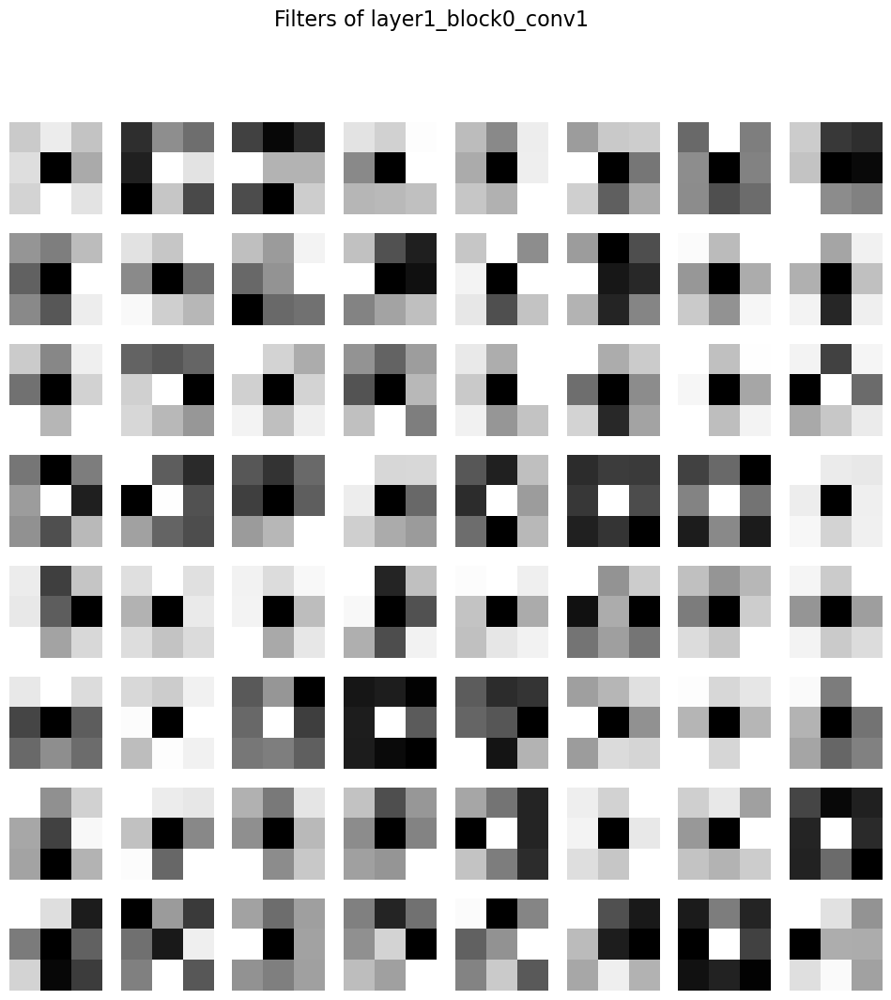

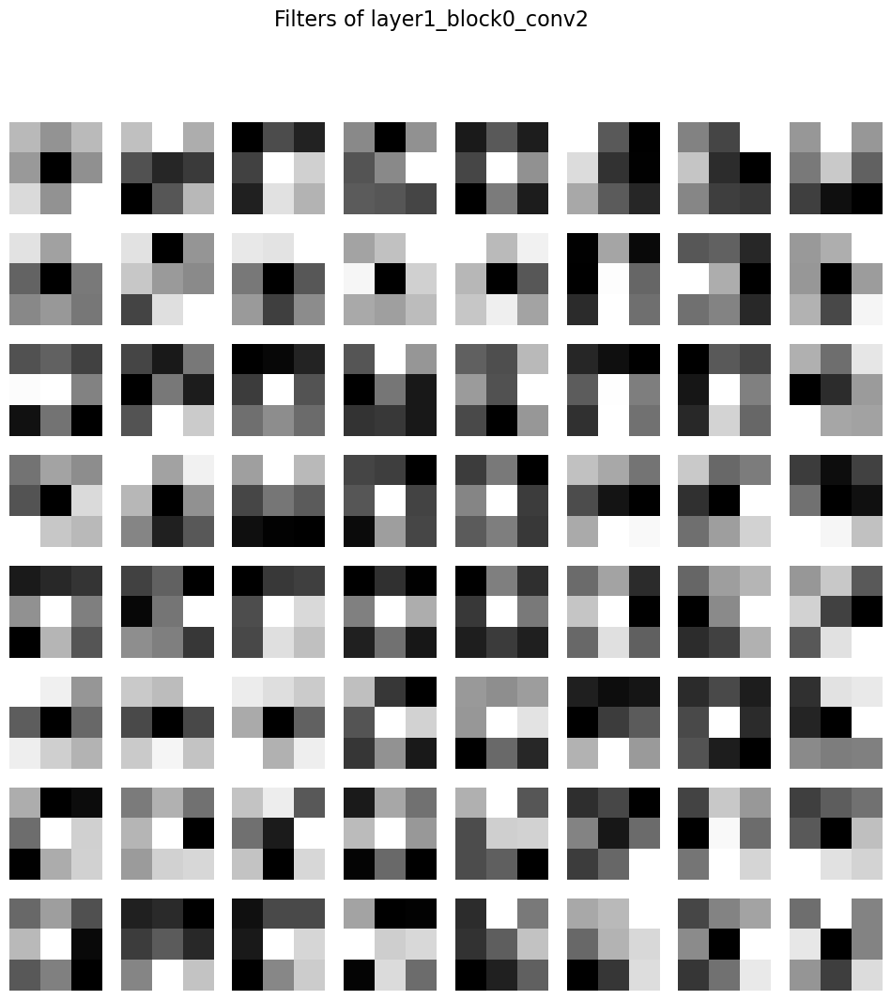

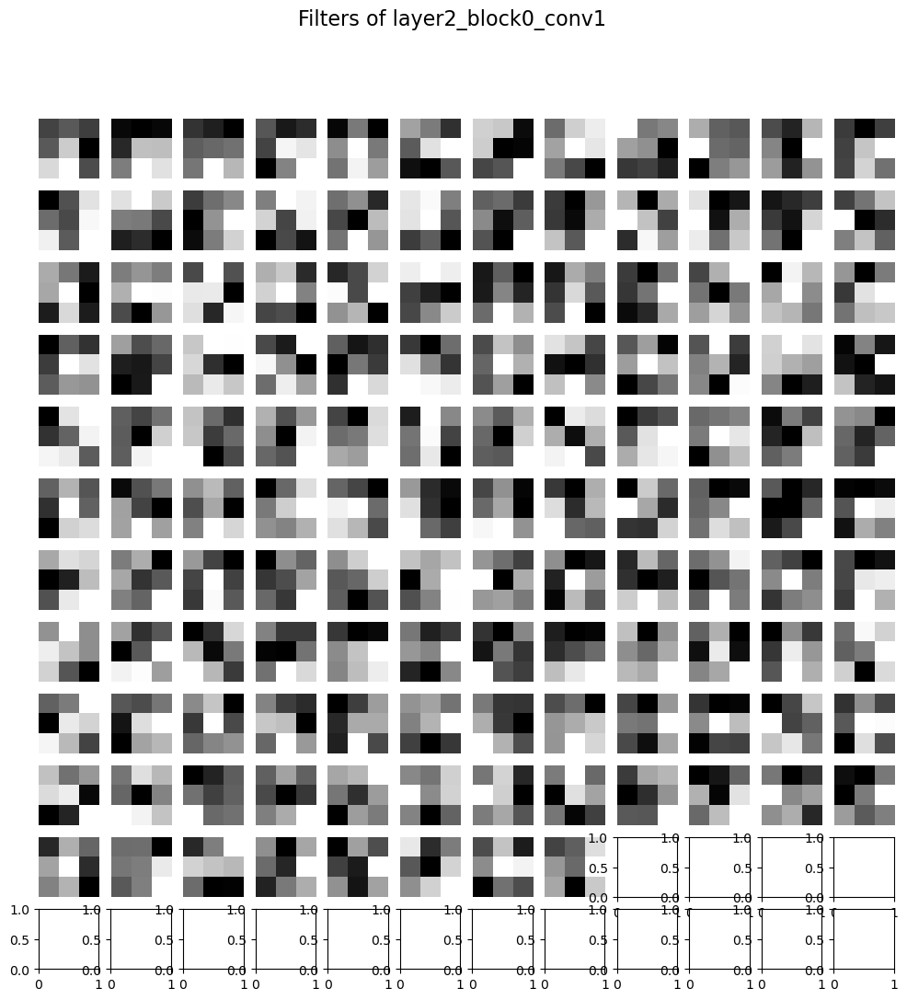

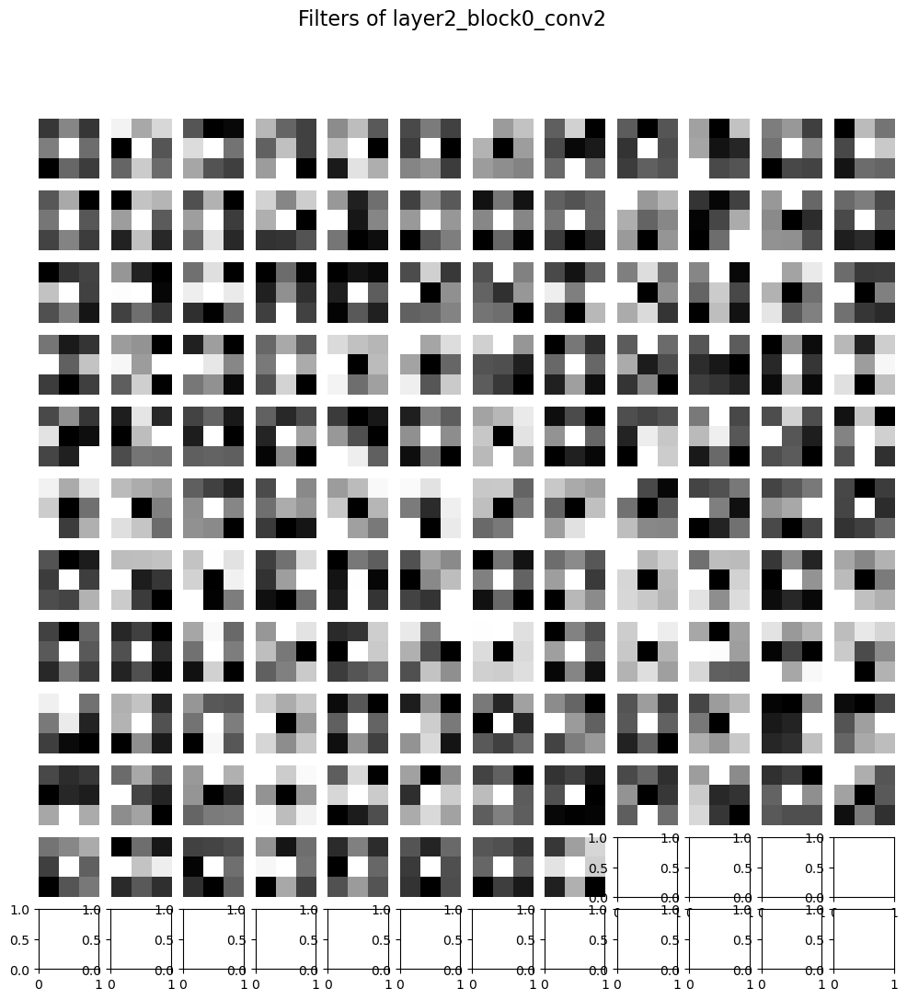

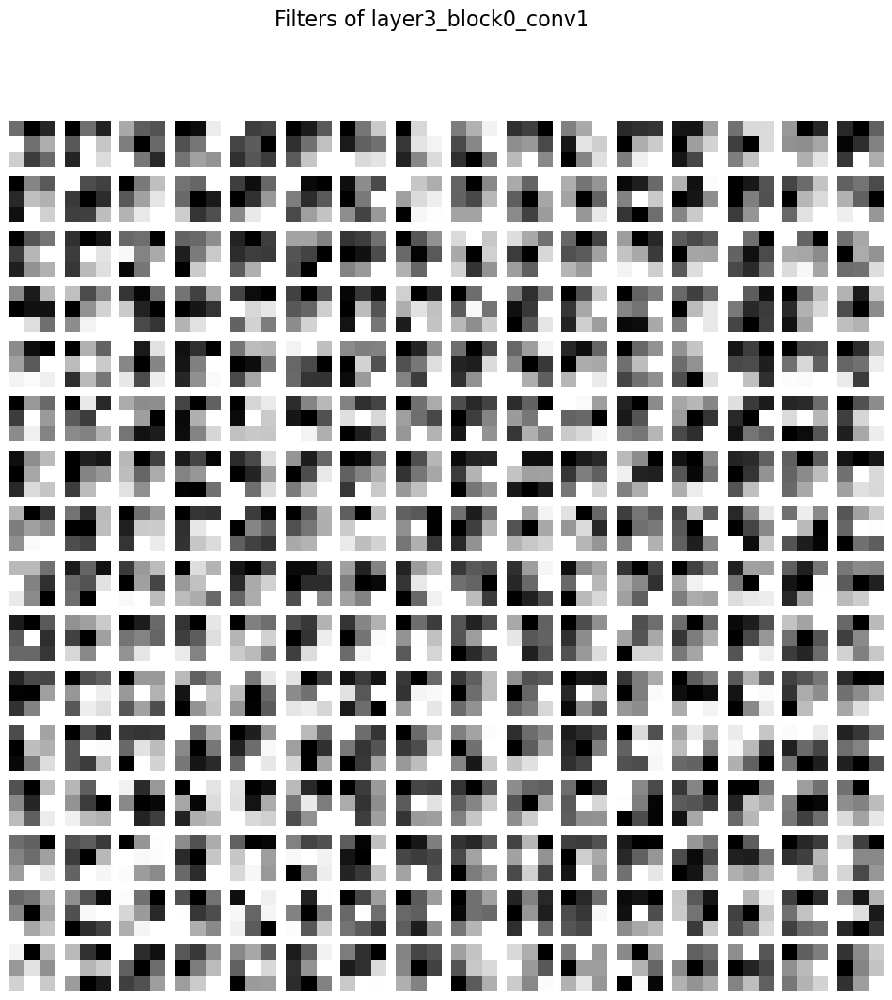

...

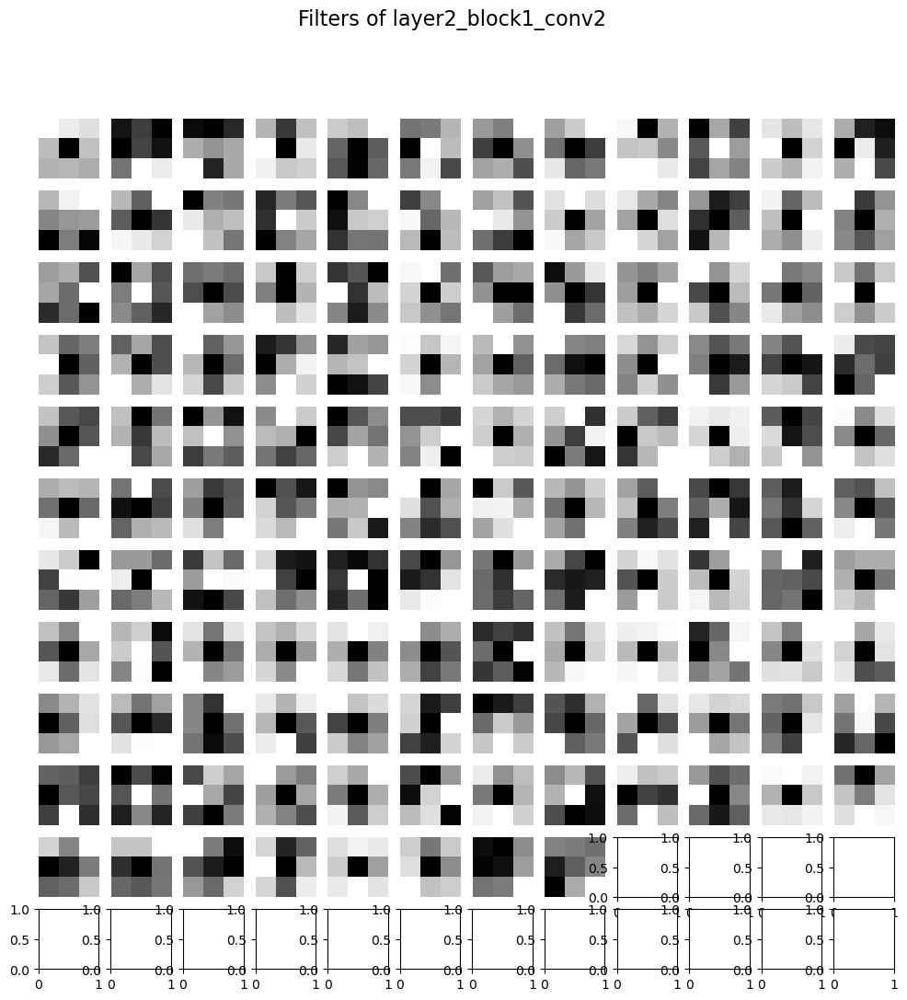

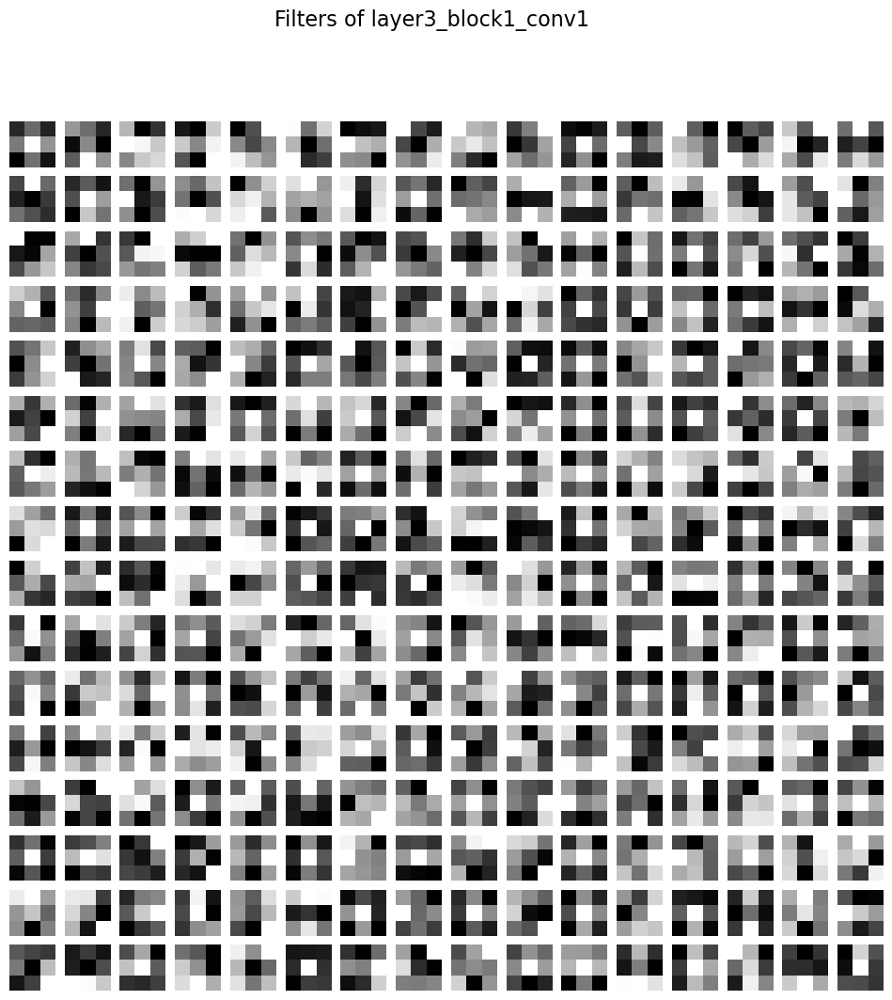

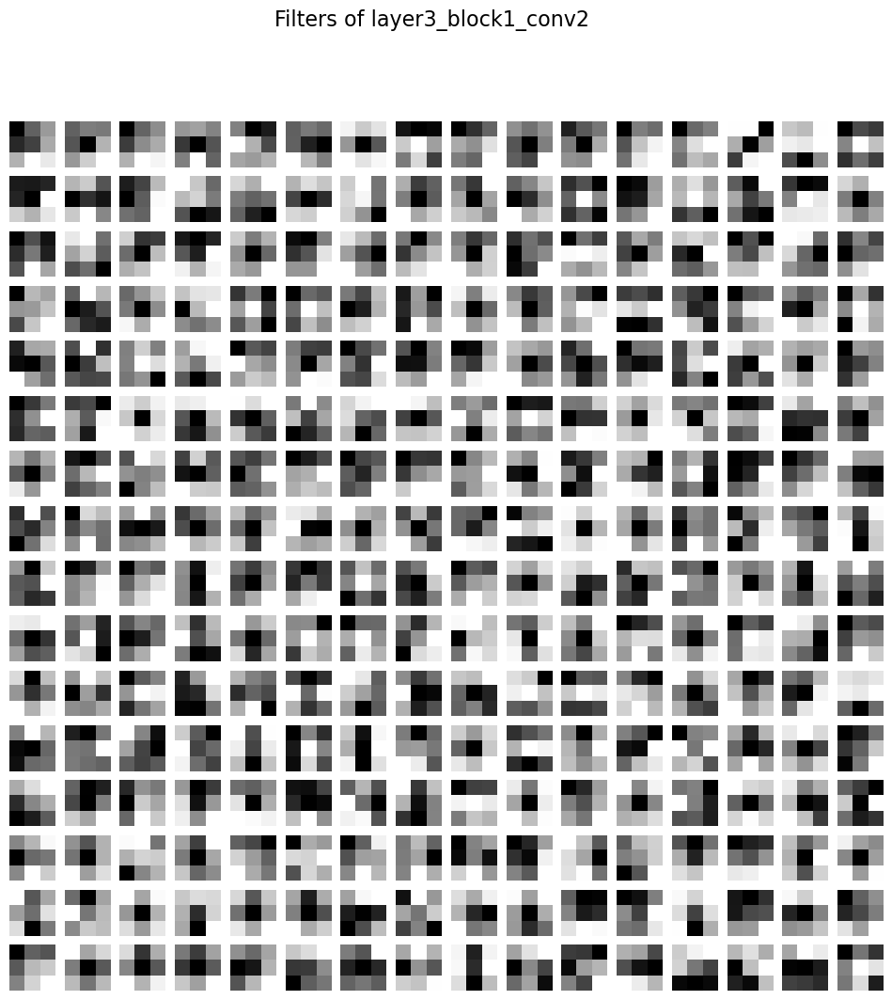

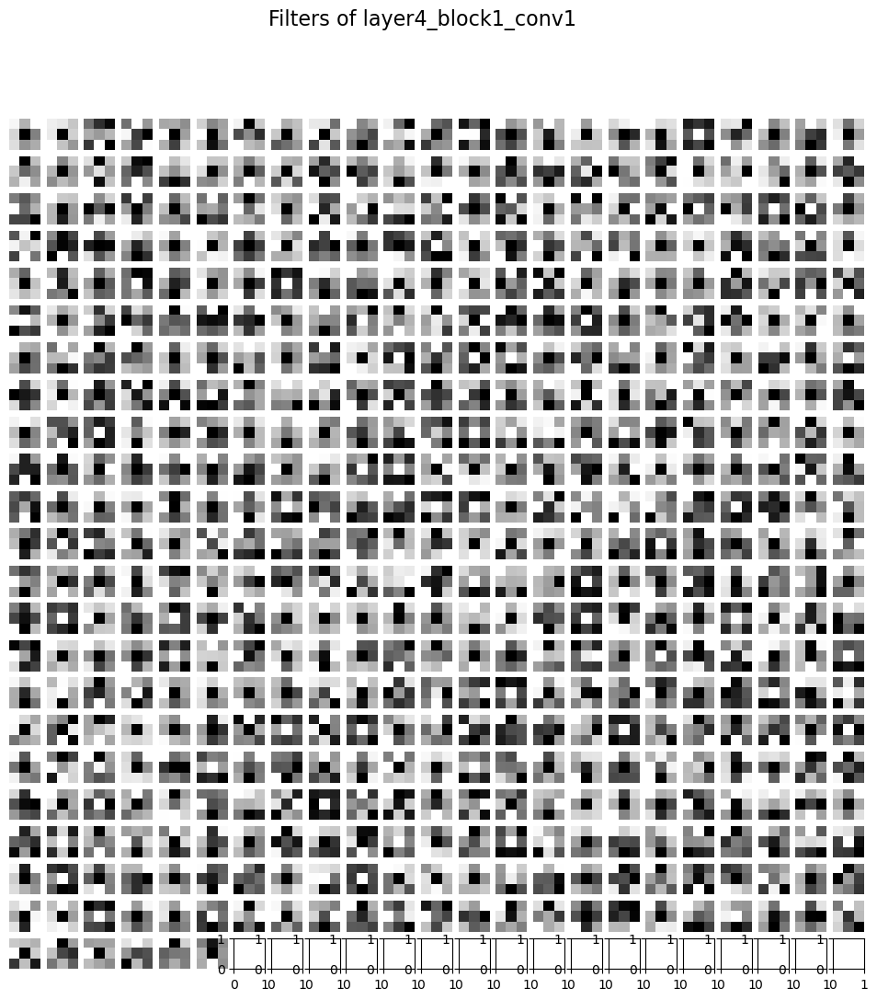

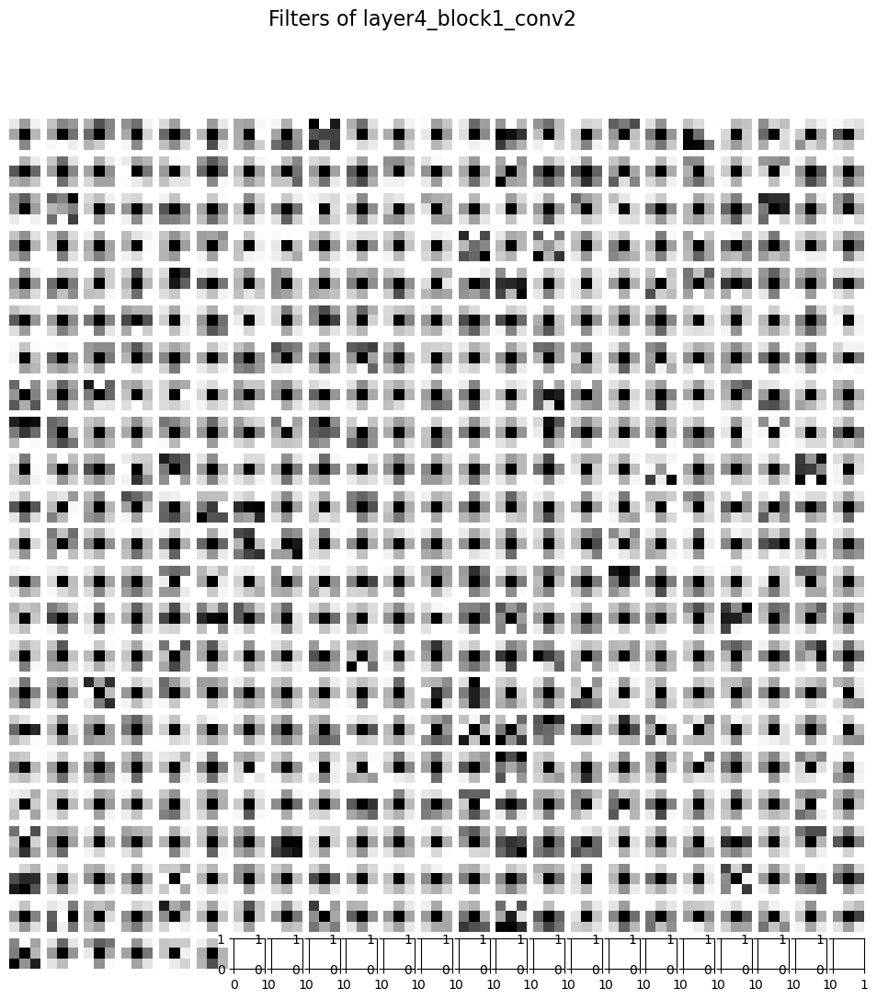

Visualizing activation maps for all convolutional layers:
Visualizing activation maps at conv1:


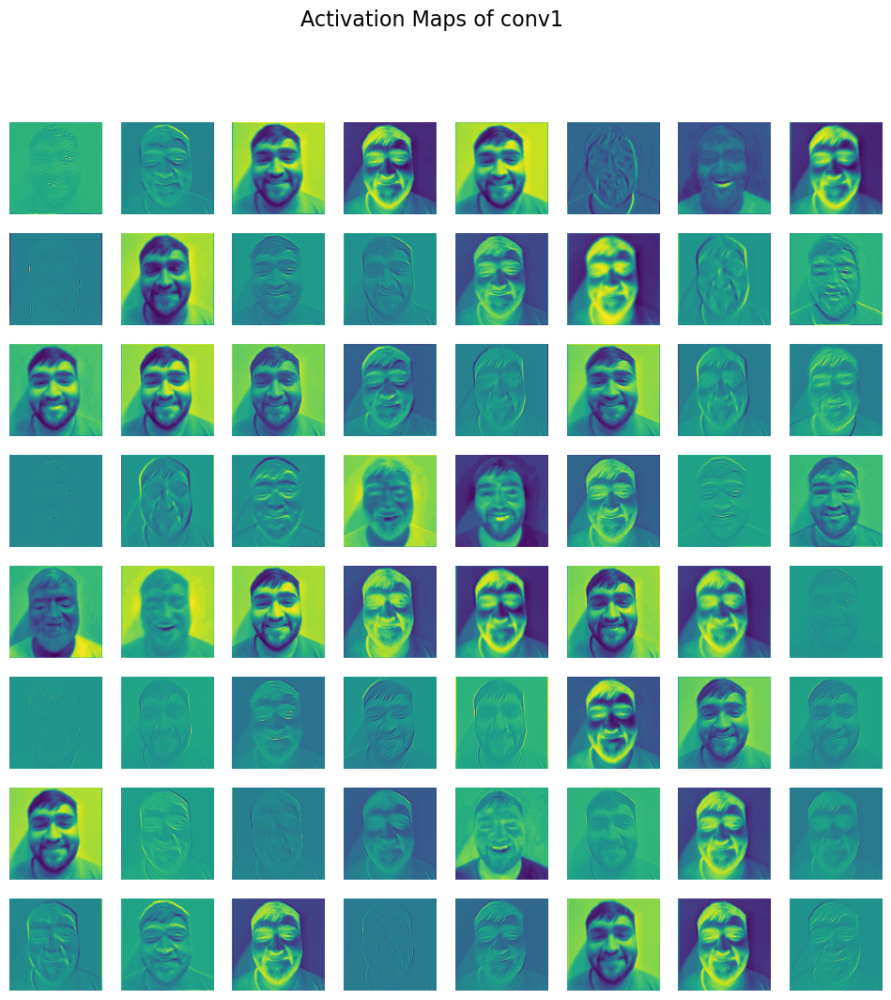

Visualizing activation maps at layer1_block0_conv1:


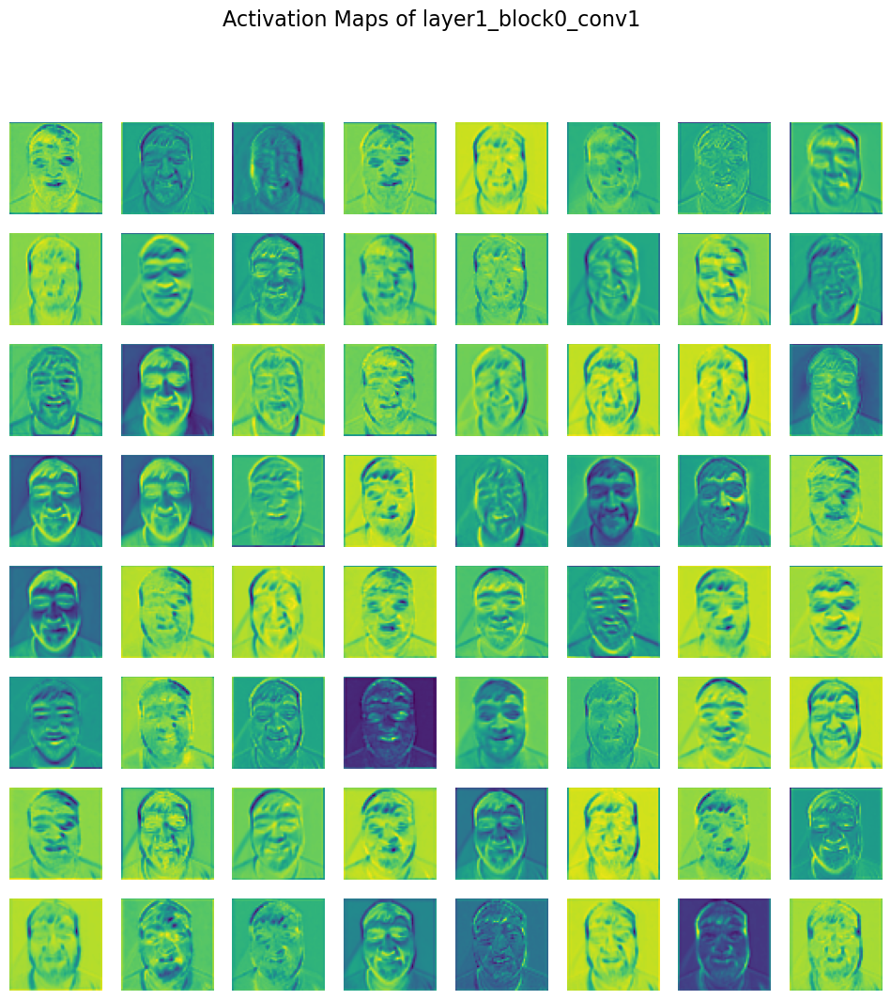

Visualizing activation maps at layer1_block0_conv2:


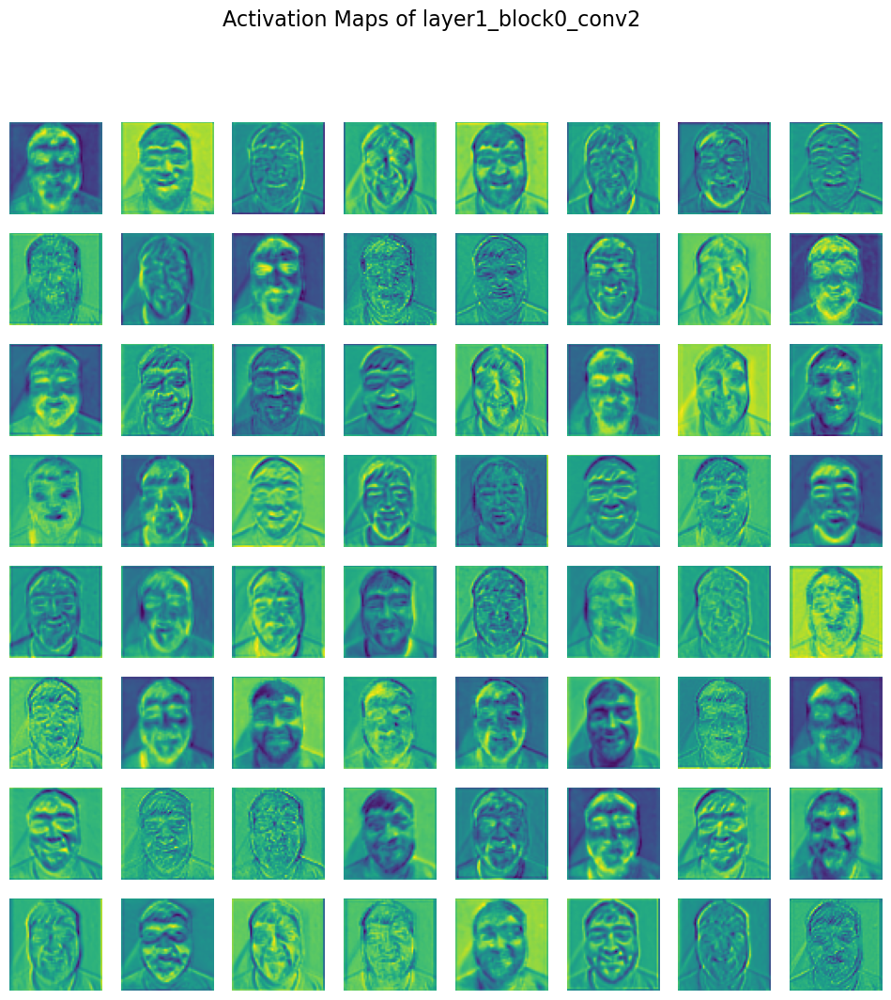

Visualizing activation maps at layer1_block1_conv1:


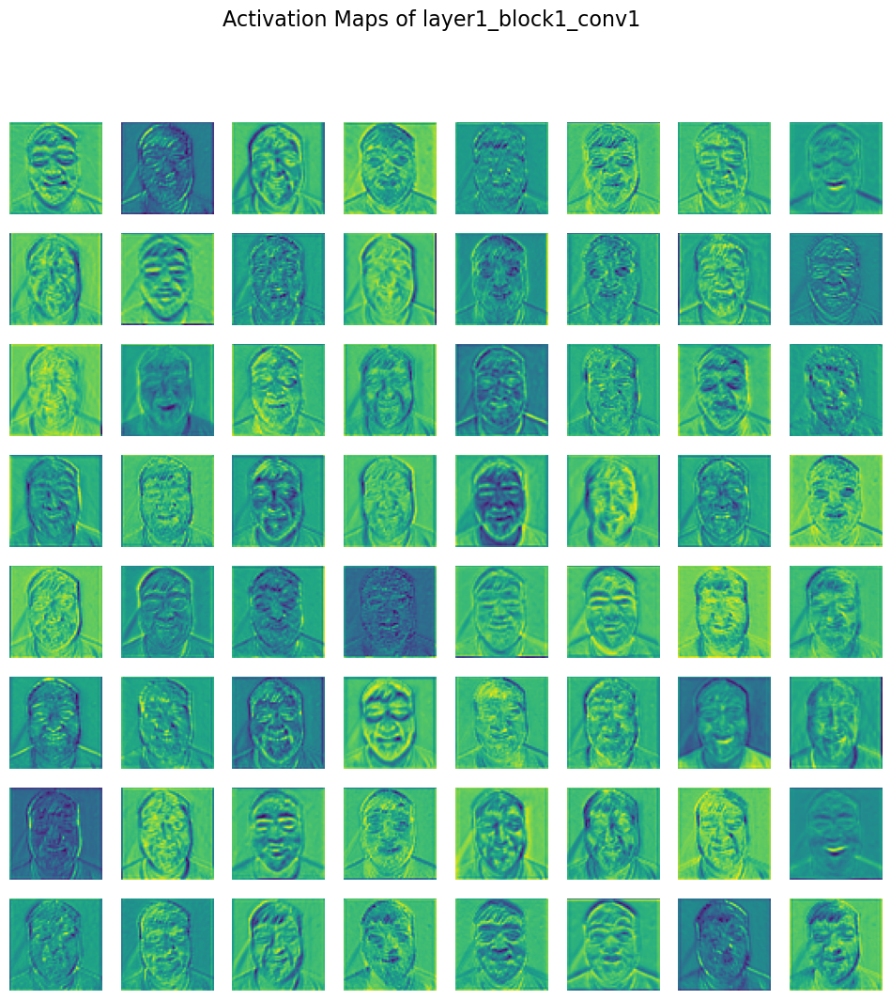

Visualizing activation maps at layer1_block1_conv2:


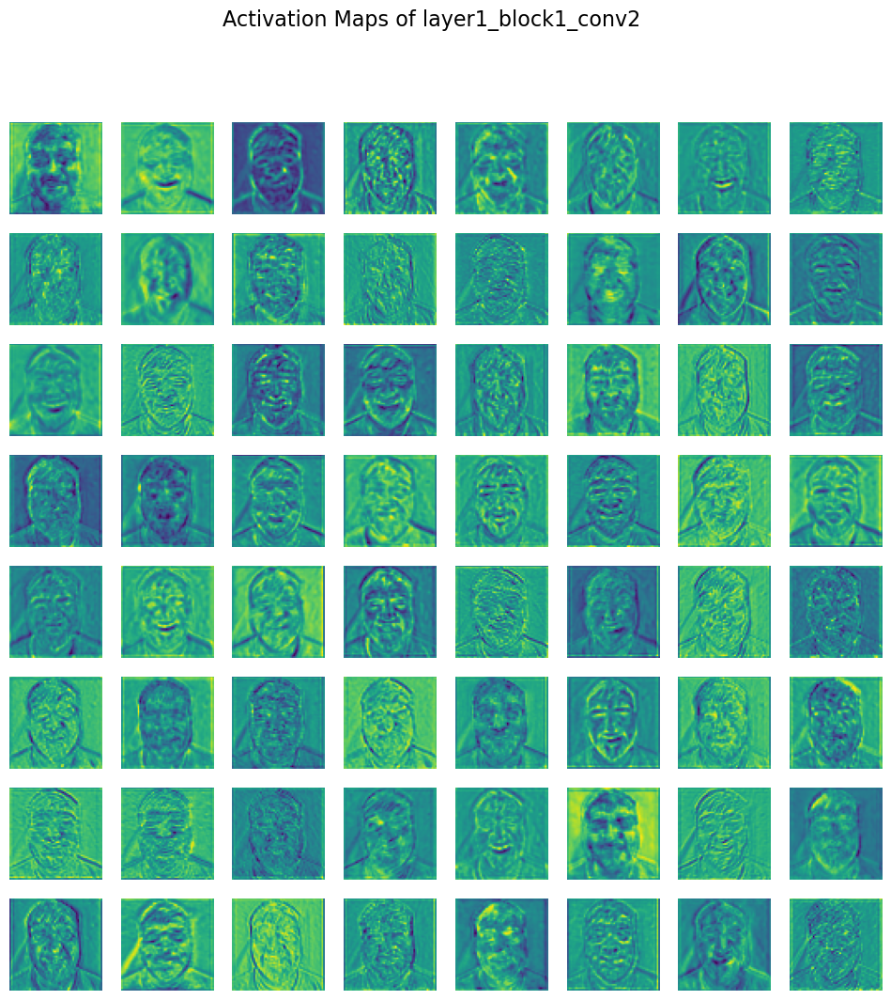

Visualizing activation maps at layer2_block0_conv1:


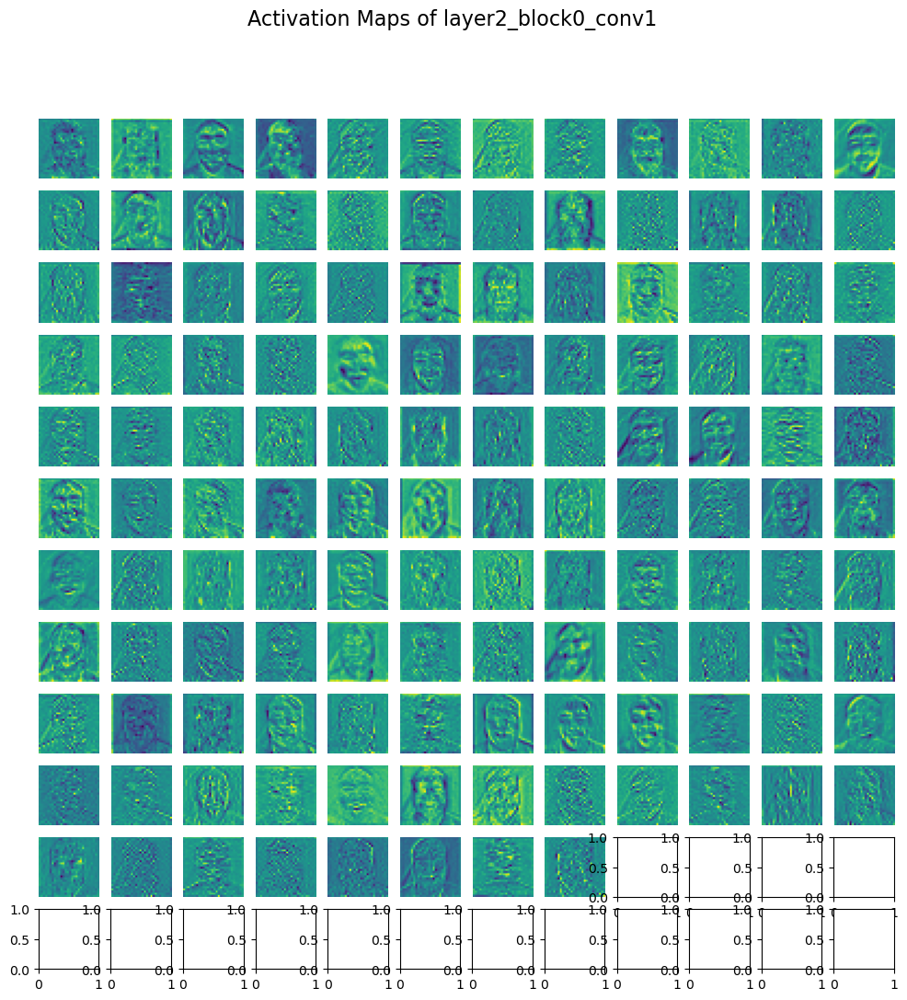

Visualizing activation maps at layer2_block0_conv2:


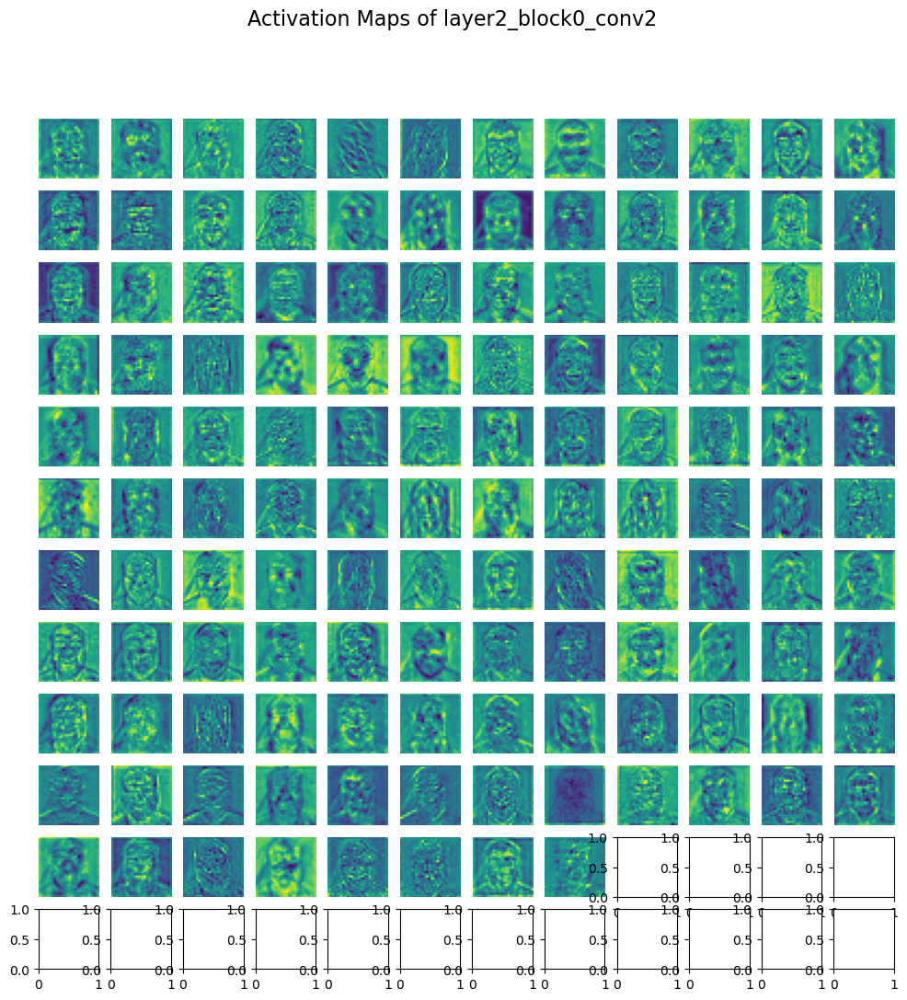

Visualizing activation maps at layer2_block1_conv1:


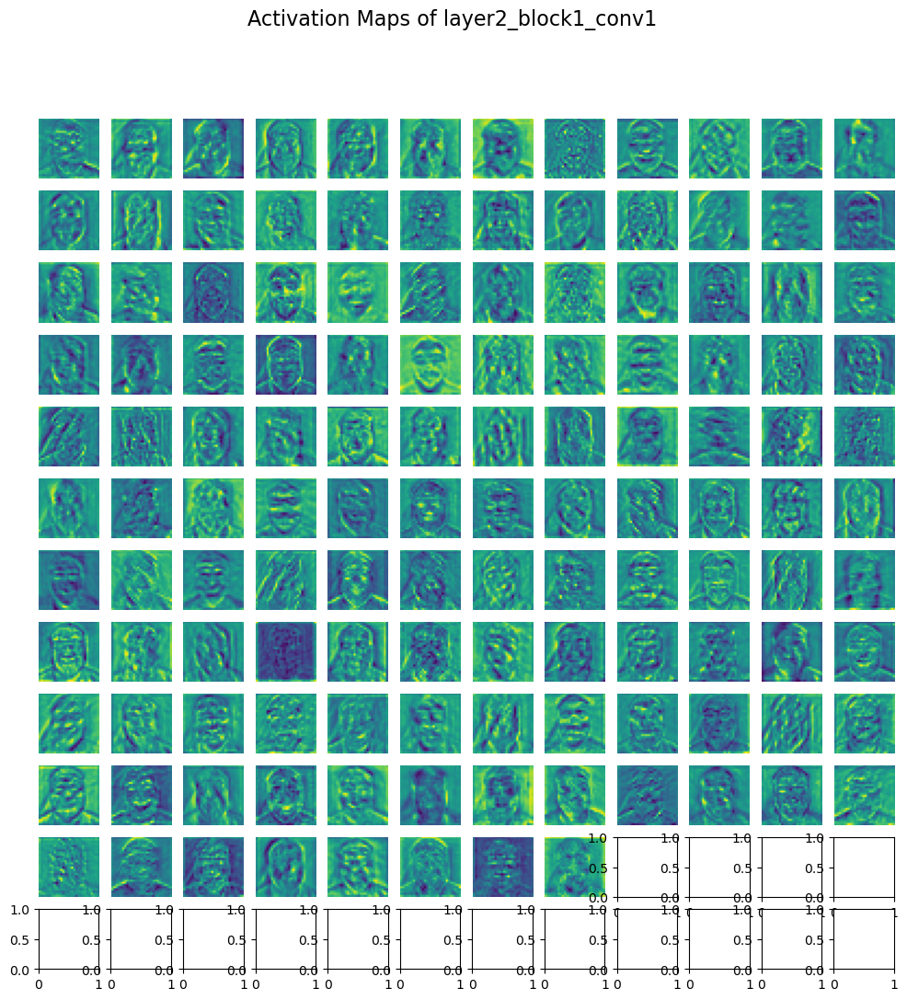

Visualizing activation maps at layer2_block1_conv2:


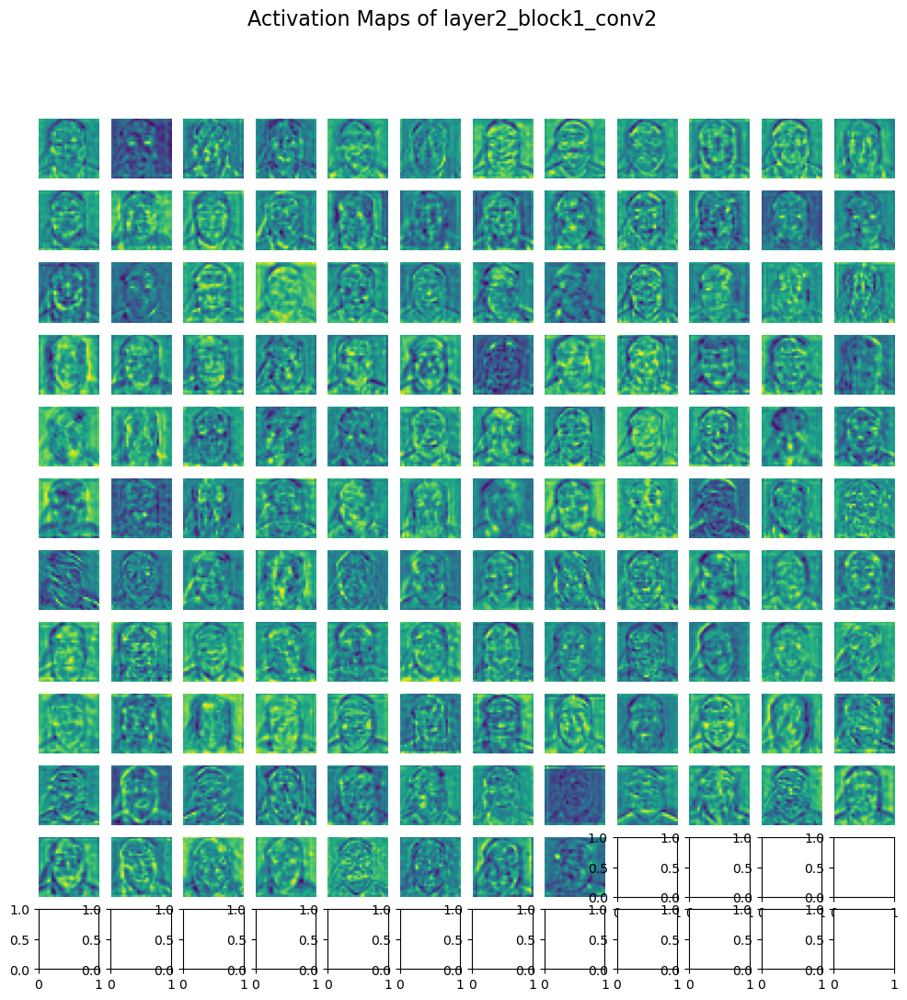

Visualizing activation maps at layer3_block0_conv1:


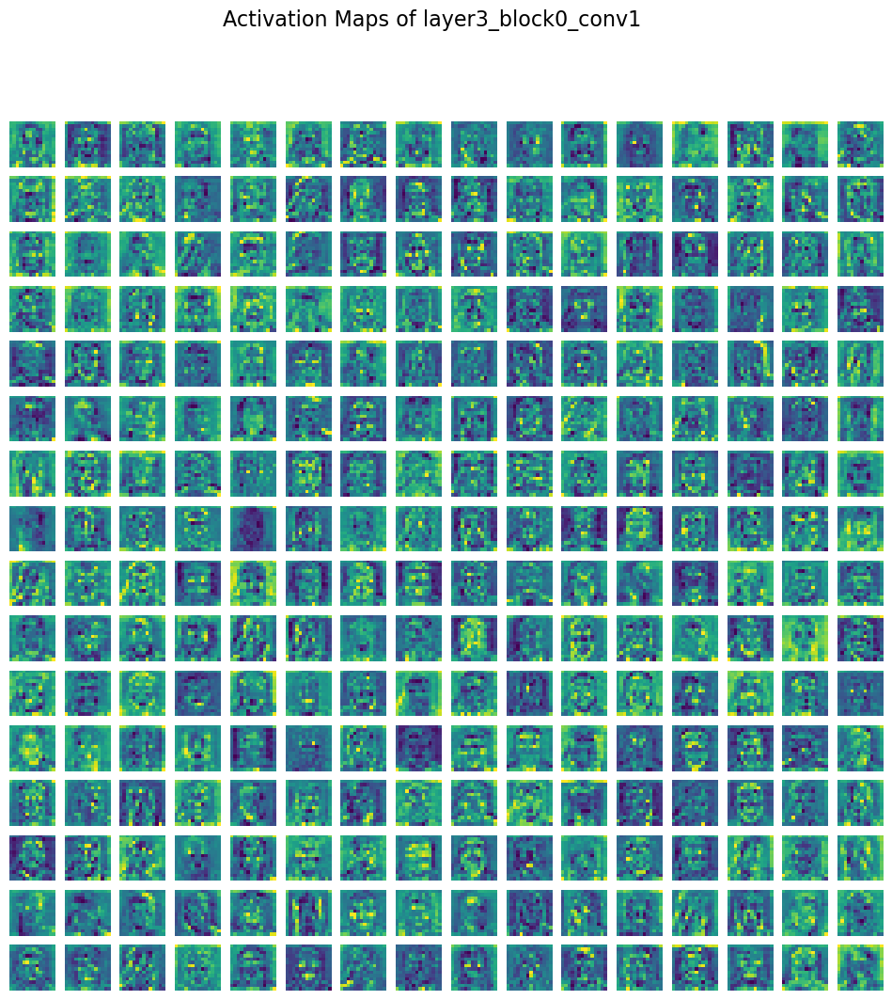

Visualizing activation maps at layer3_block0_conv2:


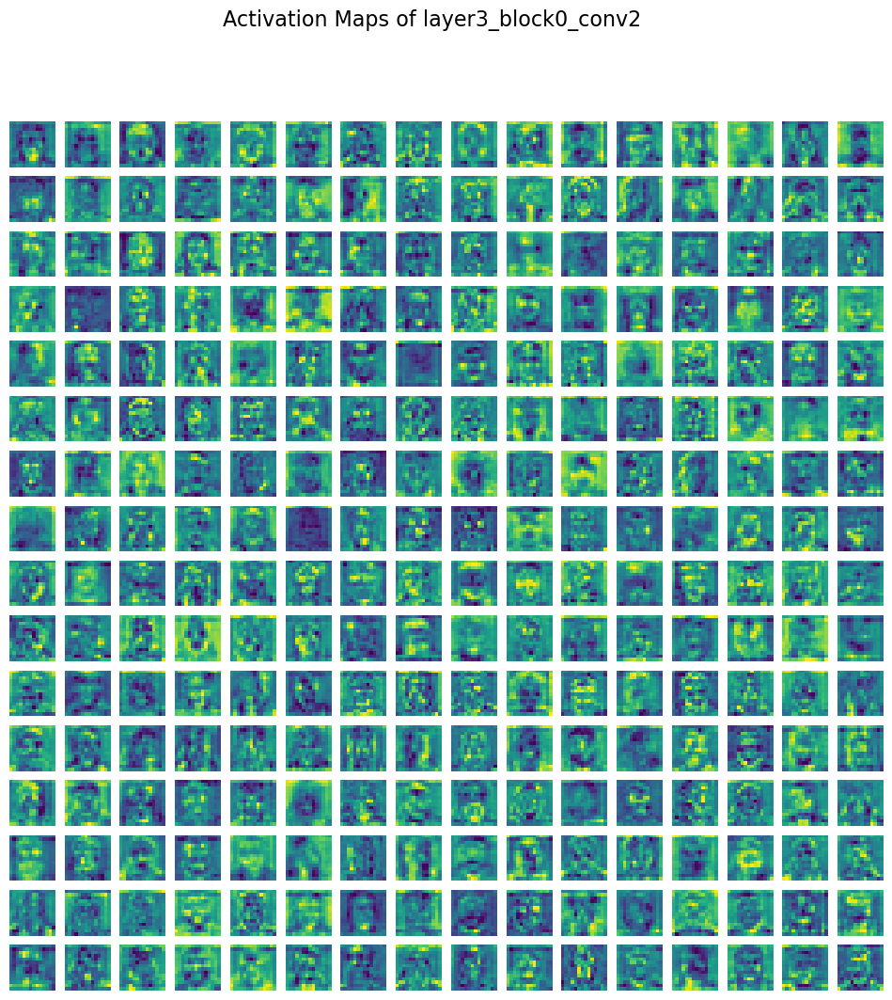

Visualizing activation maps at layer3_block1_conv1:


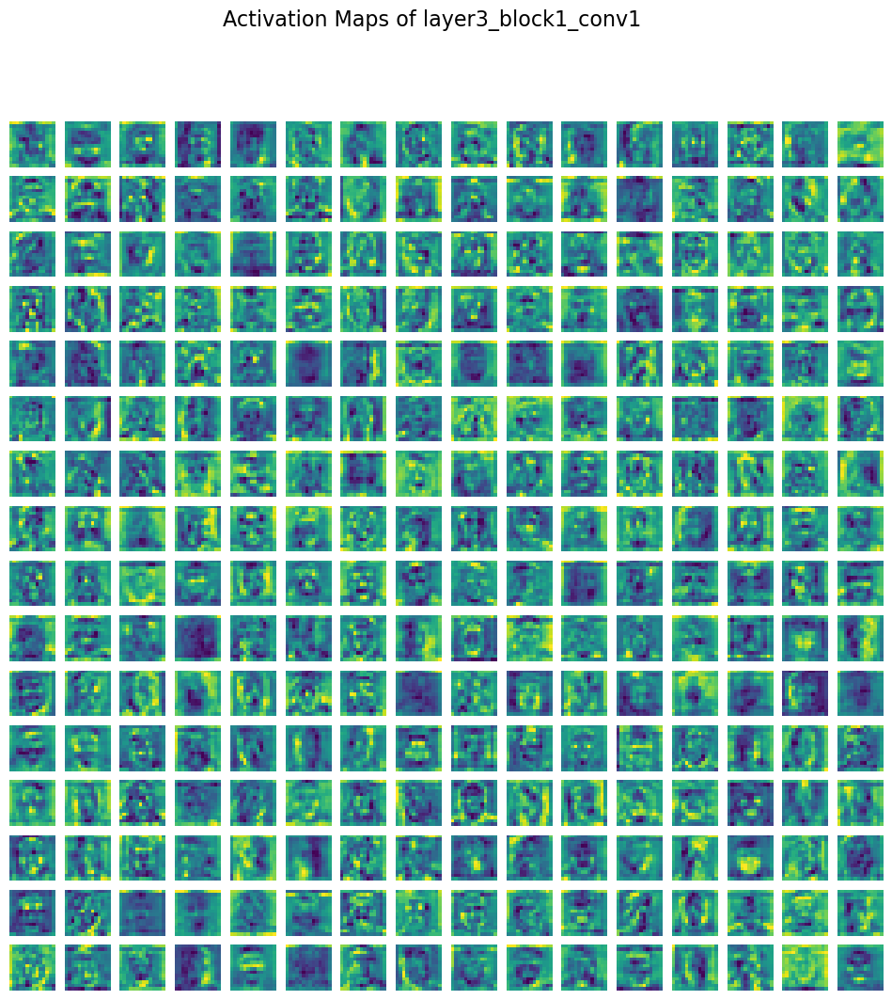

Visualizing activation maps at layer3_block1_conv2:


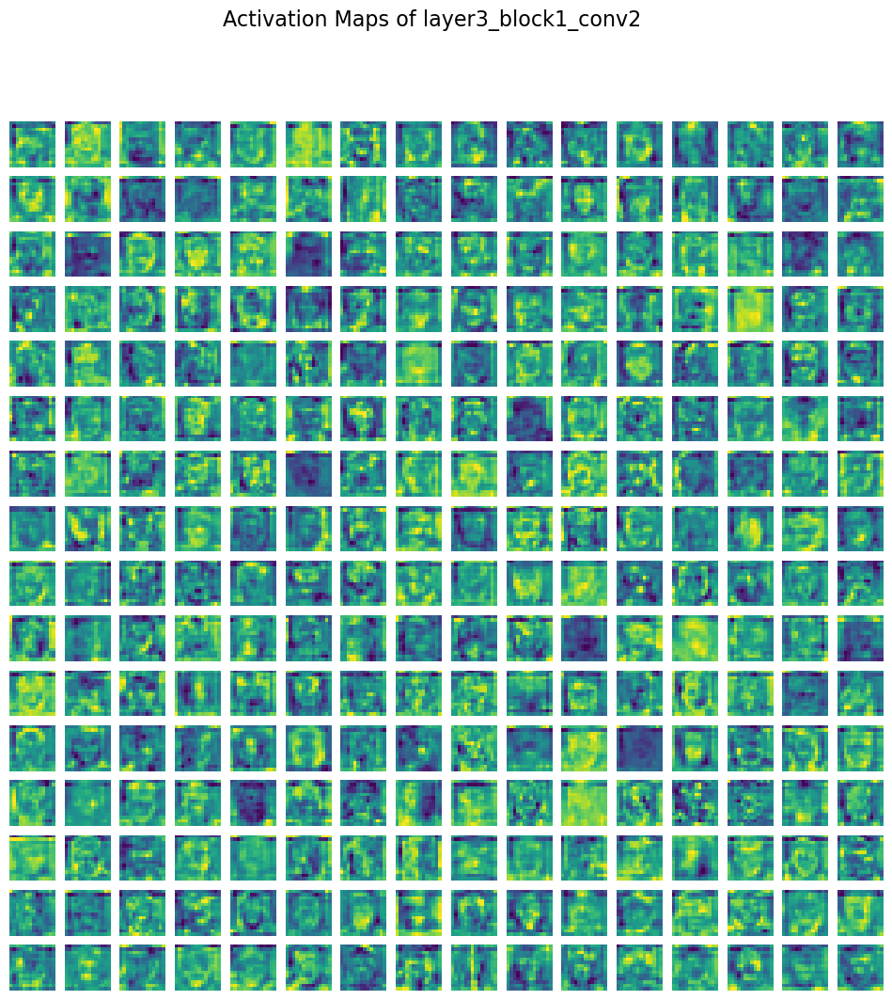

Visualizing activation maps at layer4_block0_conv1:


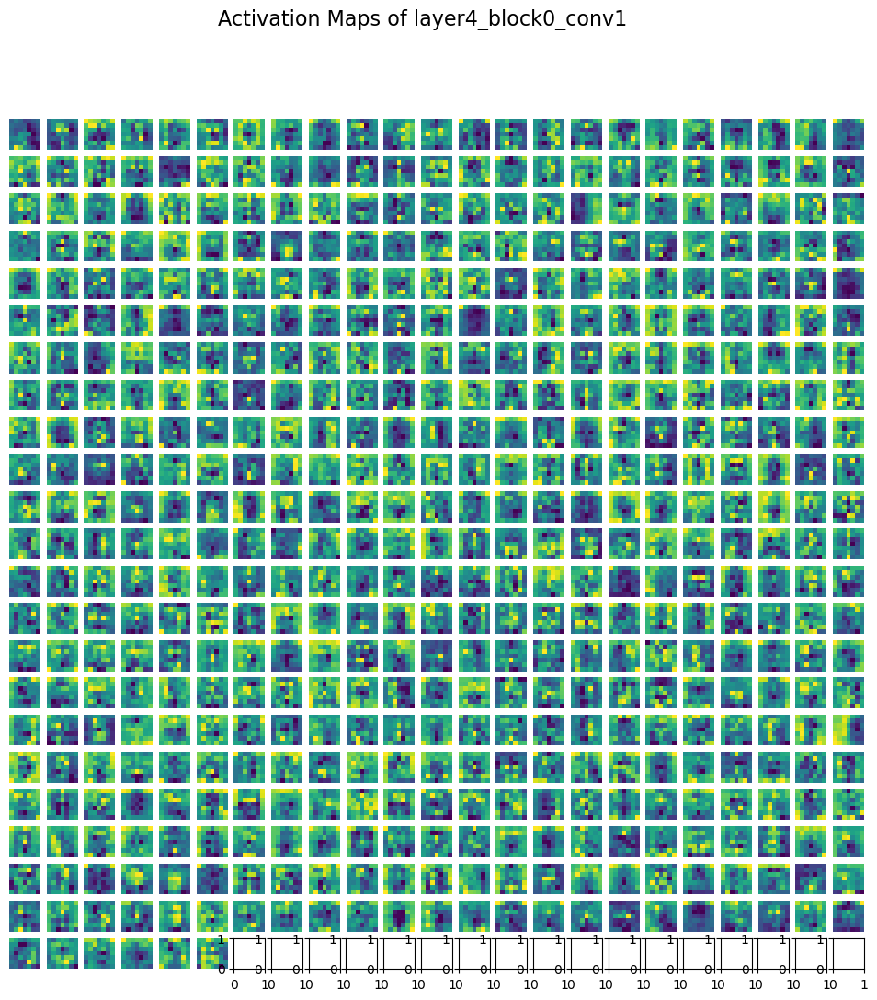

Visualizing activation maps at layer4_block0_conv2:


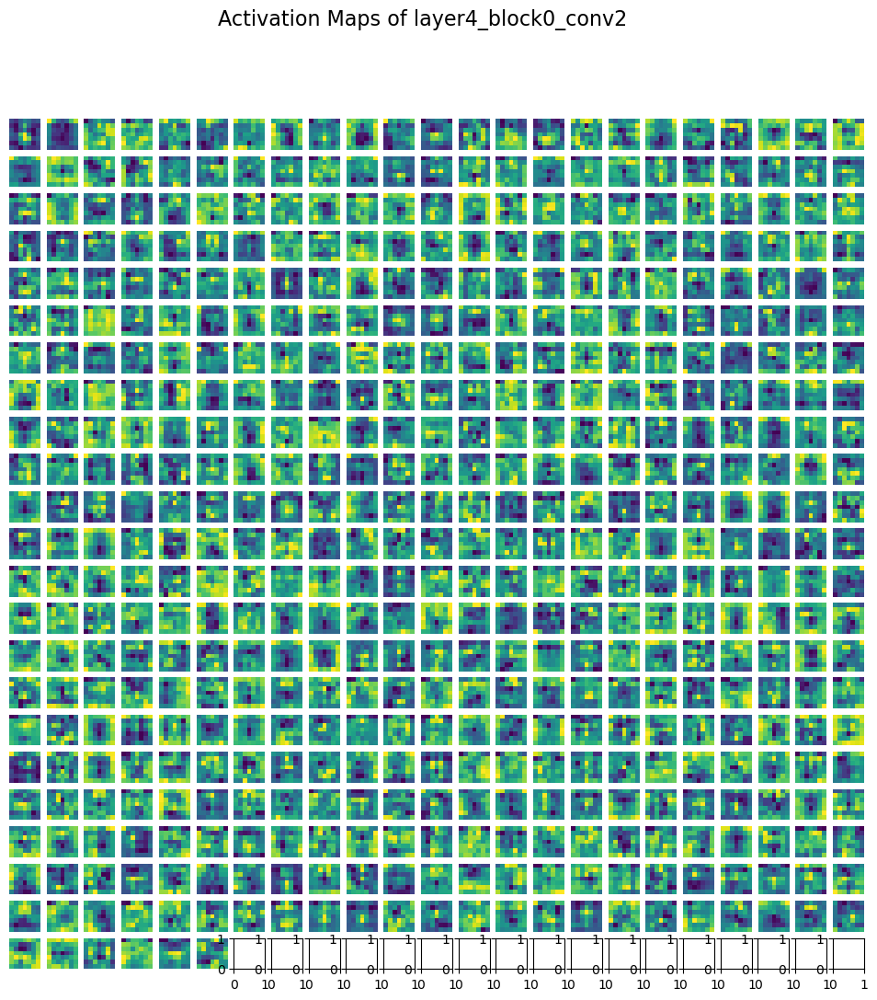

Visualizing activation maps at layer4_block1_conv1:


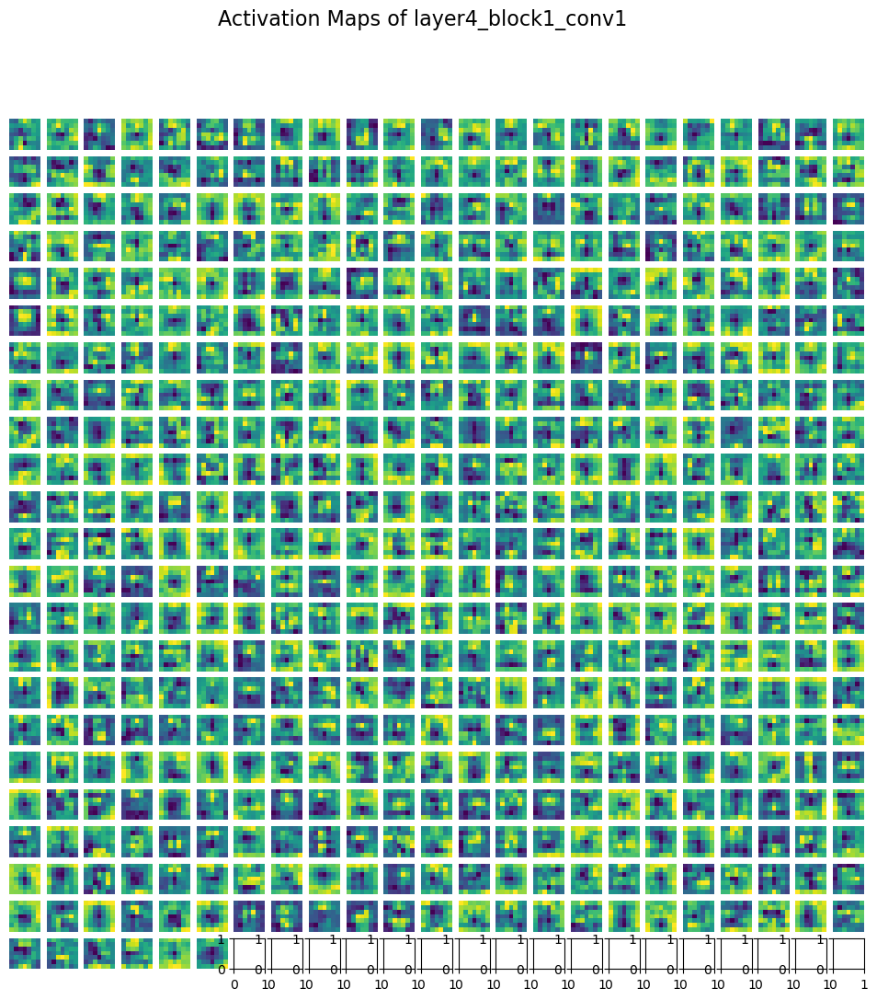

Visualizing activation maps at layer4_block1_conv2:


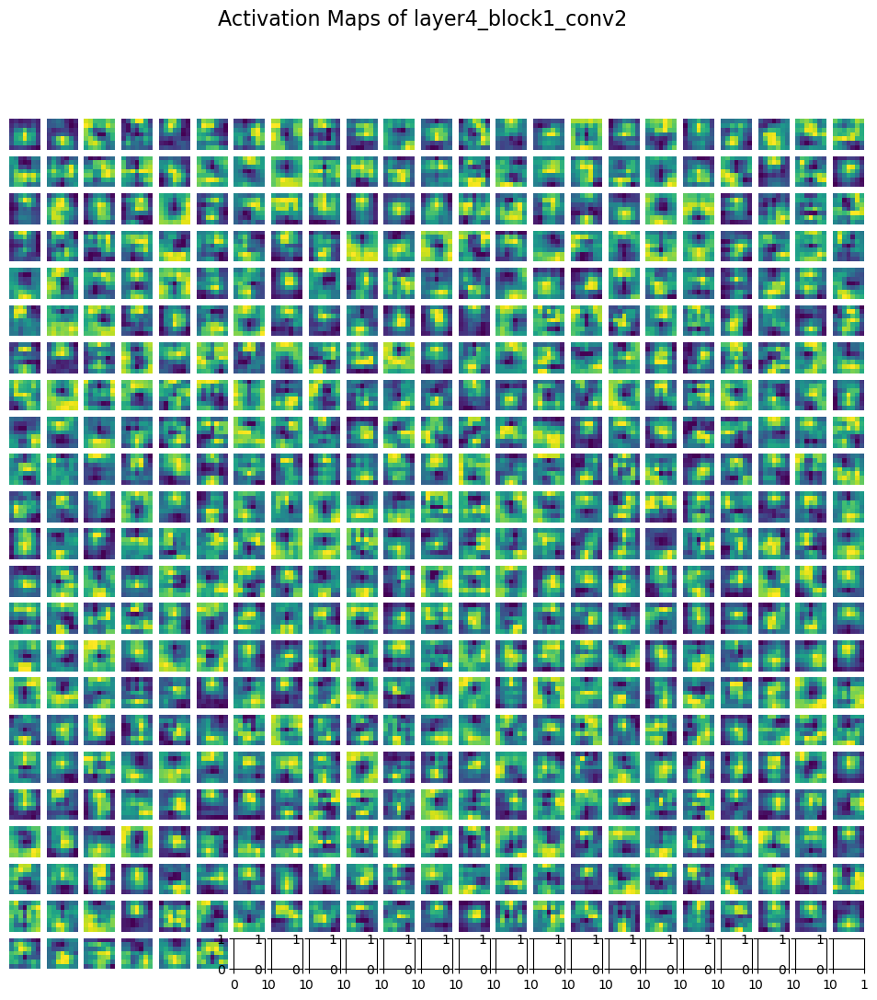

Prediction: Arched Eyebrows not detected with probability 0.8576


In [32]:
for i in range(2):
    visualize_filters(model.layer1[i].conv1, f'layer1_block{i}_conv1')
    visualize_filters(model.layer1[i].conv2, f'layer1_block{i}_conv2')

    visualize_filters(model.layer2[i].conv1, f'layer2_block{i}_conv1')
    visualize_filters(model.layer2[i].conv2, f'layer2_block{i}_conv2')

    visualize_filters(model.layer3[i].conv1, f'layer3_block{i}_conv1')
    visualize_filters(model.layer3[i].conv2, f'layer3_block{i}_conv2')

    visualize_filters(model.layer4[i].conv1, f'layer4_block{i}_conv1')
    visualize_filters(model.layer4[i].conv2, f'layer4_block{i}_conv2')

# Visualize activation maps at various layers and blocks
print("Visualizing activation maps for all convolutional layers:")
for layer in activation_maps:
    print(f"Visualizing activation maps at {layer}:")
    visualize_activations(activation_maps[layer], layer)

# Print the prediction for "Arched_Eyebrows"
if prediction >= 0.5:
    print(f"Prediction: Arched Eyebrows detected with probability {prediction:.4f}")
else:
    print(f"Prediction: Arched Eyebrows not detected with probability {1 - prediction:.4f}")


In [21]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import models , transforms
from PIL import Image
import torch.nn as nn


In [22]:
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [23]:
#img_path = ''  # Replace with your image path
img_path = '/home/aayushjeevan/Desktop/YOLOv3/mugshot.jpeg'  # Replace with your image path
image = Image.open(img_path).convert('RGB')

# Preprocess the image
input_image = preprocess(image).unsqueeze(0)  # Add batch dimension

In [24]:
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1)  # Binary output for Arched Eyebrows

# Load the trained weights (Replace with your actual saved model path)
model.load_state_dict(torch.load('/home/aayushjeevan/Desktop/YOLOv3/resnet18_arch_eyebrows 1.pth', map_location=torch.device('cpu')))
model.eval()

/tmp/ipykernel_115641/1832059663.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('/home/aayushjeevan/Desktop/YOLOv3/resnet18_arch_eyebro

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [25]:
def get_prediction(input_image):
    with torch.no_grad():
        output = model(input_image)
        prediction = torch.sigmoid(output).item()  # Apply sigmoid for binary output
    return prediction

# Occlusion function
def occlusion_experiment(input_image, occlusion_size=32, stride=16):
    _, _, height, width = input_image.shape
    heatmap = np.zeros((height, width))
    
    # Iterate over the image with a sliding window
    for h in range(0, height, stride):
        for w in range(0, width, stride):
            # Make a copy of the original image
            occluded_image = input_image.clone()
            
            # Apply a mask (mean of the dataset used for normalization) to the image patch
            occluded_image[:, :, h:h+occlusion_size, w:w+occlusion_size] = 0  # Mask out the region
            
            # Get the model's prediction on the occluded image
            pred = get_prediction(occluded_image)
            
            # Assign the prediction to the corresponding region in the heatmap
            heatmap[h:h+occlusion_size, w:w+occlusion_size] = pred
    
    return heatmap

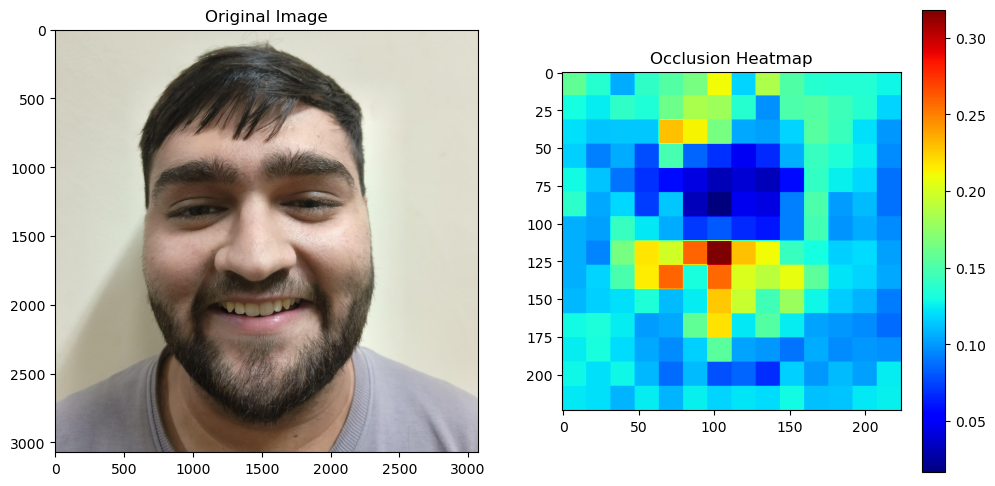

Prediction: Arched eyebrows  not detected with probability 0.8576


In [26]:
occlusion_heatmap = occlusion_experiment(input_image)

# Plot the original image and the occlusion heatmap
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(np.array(image))
plt.title("Original Image")

# Occlusion heatmap
plt.subplot(1, 2, 2)
plt.imshow(occlusion_heatmap, cmap='jet')
plt.colorbar()
plt.title("Occlusion Heatmap")

plt.show()

# Get final prediction for the full image
final_prediction = get_prediction(input_image)

# Print the prediction for "Arched_Eyebrows"
if final_prediction >= 0.5:
    print(f"Prediction: Arched eyebrows detected with probability {final_prediction:.4f}")
else:
    print(f"Prediction: Arched eyebrows  not detected with probability {1 - final_prediction:.4f}")